# 07 Velocity MRE

This notebook analyzes merges looms into adata.

## Initialization

In [1]:
# First import the necessary packages
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import anndata as ad
import os
from datetime import datetime as dt

# Set the verbosity of scVelo
scv.settings.verbosity = 2
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=200, frameon=False)
cr.settings.verbosity = 2
sc.settings.verbosity = 2
sc.logging.print_header()

scanpy==1.9.6 anndata==0.10.3 umap==0.5.5 numpy==1.24.4 scipy==1.11.3 pandas==2.1.1 scikit-learn==1.1.3 statsmodels==0.14.0 igraph==0.11.3 louvain==0.8.1 pynndescent==0.5.11


In [2]:
# Name Variables and Settings
prefix = "07_"                                            # Filename prefix        
suffix = "_velocity_MRE"                                    # Filename suffix   
savedata = True                                          # Save data at the end

# Set working directory
os.chdir("/home/dalbao/2023-012-Runx3mutD8scRNA/AlbaoRunx3Manuscript/single_cell/07_velocity")

# Determine work location
print("The work location for this notebook is: " + os.getcwd() + "\n")

# Get a timestamp for the start of the run
timestamp = dt.now()
print("This notebook was last run on " + timestamp.strftime("%y-%m-%d %H:%M") + " UTC\n")

# Determine the filename for the expected output h5ad
fn = prefix + timestamp.strftime("%y-%m-%d-%H-%M")
print("The filename for the AnnData output of this notebook will be:")
print(fn + suffix + ".h5ad")
print("which will be saved in the WORKDIR/h5ad/ folder.\n")

The work location for this notebook is: /home/dalbao/2023-012-Runx3mutD8scRNA/AlbaoRunx3Manuscript/single_cell/07_velocity

This notebook was last run on 25-12-09 10:50 UTC

The filename for the AnnData output of this notebook will be:
07_25-12-09-10-50_velocity_MRE.h5ad
which will be saved in the WORKDIR/h5ad/ folder.



The input h5ad file is: h5ad/07_25-12-09-09-18_loomed_MRE.h5ad
AnnData object with n_obs × n_vars = 28407 × 18505
    obs: 'experiment', 'group', 'timepoint', 'infection', 'cell_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'scDblFinder_score', 'scDblFinder_class', 'gem', 'QC', 'n_genes', 'S_score', 'G2M_score', 'phase', 'leiden_r1.5', 'leiden_r1', 'leiden_r0.9', 'leiden_r0.8', 'leiden_r0.7', 'leiden_r0.6', 'leiden_r0.5', 'leiden_r0.4', 'leiden_r0.3', 'leiden_r0.2', 'leiden_r0.1', 'leiden_r1_as_resolved', 'sample_batch', 'batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'mt', 'ribo', 'n_cells_by_counts-gem1', 'mean_counts-gem1', 'log1p_mean_counts-gem1', 'pct_dropout_by_counts-gem1', 'total_counts-gem1', 'log1p_total_counts-gem1', 'n_cells_by_cou

/opt/conda/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


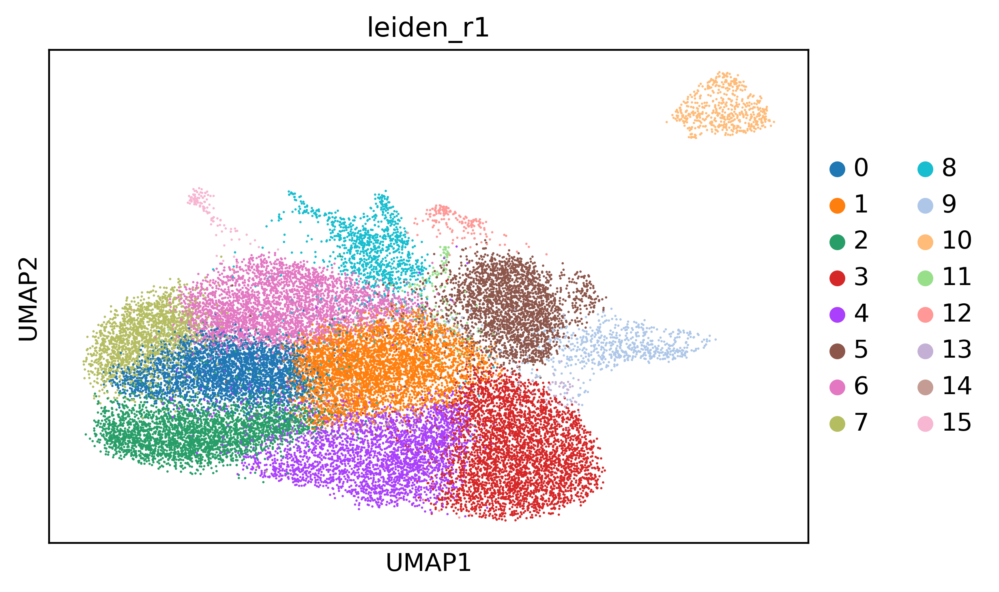

group
WT        4830
Null      4565
dAD       4351
Base      4197
dID       4011
dVWRPY    3731
d8        1209
d5         969
Naive      544
Name: count, dtype: int64

In [3]:
# Determine input file
input = "07_25-12-09-09-18_loomed_MRE.h5ad"
print("The input h5ad file is: h5ad/" + input)

# List items in outs folder
adata = ad.read_h5ad("../../h5ad/" + input)

# Inspect AnnData
print(adata)
sc.pl.umap(adata, color = "leiden_r1")
adata.obs.group.value_counts()

## Calculate Velocities

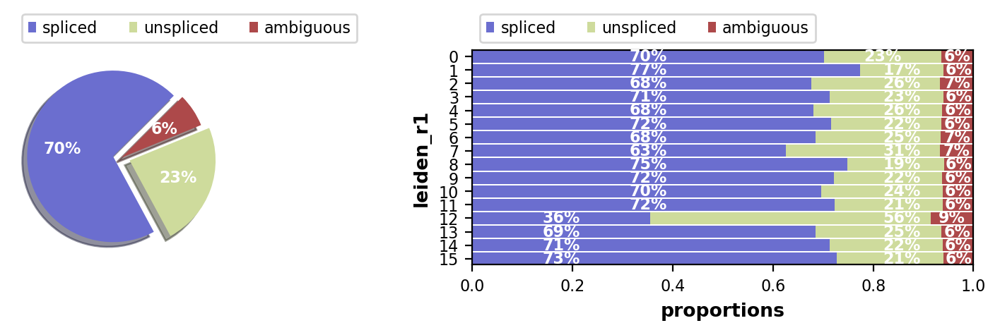

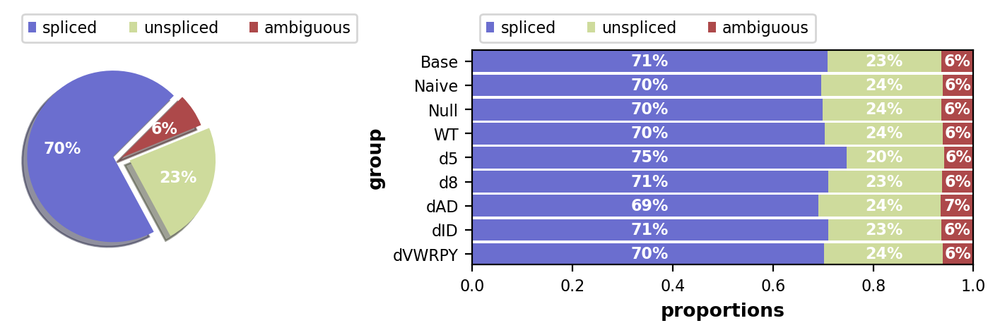

In [4]:
# Check proportion of spliced and unspliced reads
scv.pl.proportions(adata, groupby='leiden_r1')
scv.pl.proportions(adata, groupby='group')

In [5]:
# Pre-processing
scv.pp.filter_and_normalize(adata, layers_normalize = ['spliced', 'unspliced'], log = False)
scv.pp.moments(adata)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:15)
computing moments based on connectivities
    finished (0:00:17)


In [6]:
# Compute velocity
scv.tl.velocity(adata, mode='stochastic')
scv.tl.velocity_graph(adata, n_jobs=36, backend="threading")

computing velocities
    finished (0:00:23)
computing velocity graph (using 36/48 cores)


  0%|          | 0/28407 [00:00<?, ?cells/s]

    finished (0:00:30)


In [7]:
scv.tl.velocity_graph(adata, n_jobs=36, backend="threading")

computing velocity graph (using 36/48 cores)


  0%|          | 0/28407 [00:00<?, ?cells/s]

    finished (0:00:30)


computing velocity embedding
    finished (0:00:05)


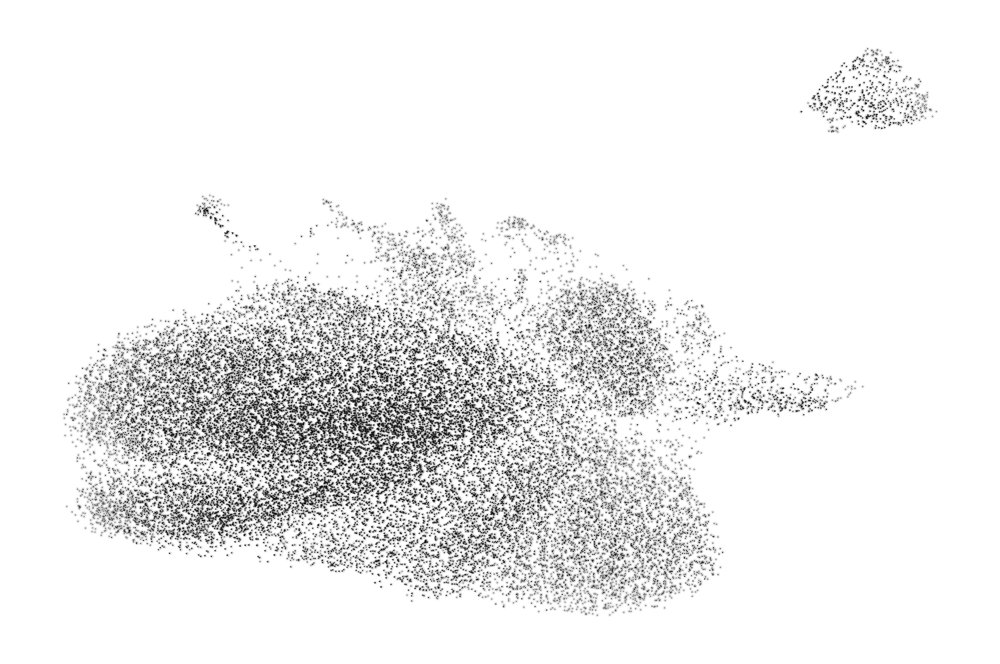

In [8]:
scv.pl.velocity_embedding(adata, basis='umap', frameon=False)

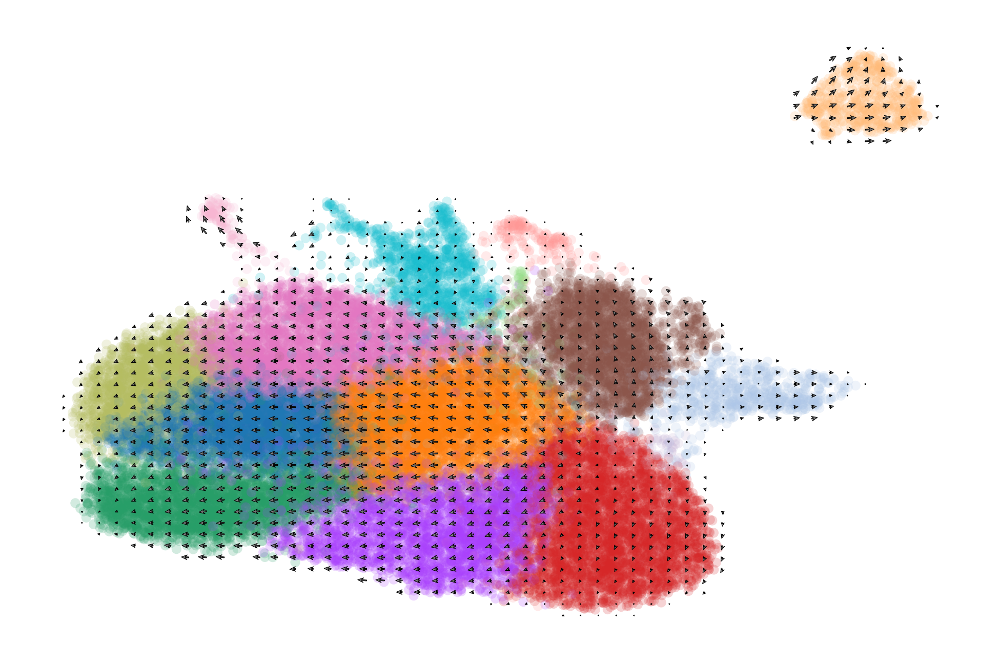

In [9]:
scv.pl.velocity_embedding_grid(adata, basis='umap', color='leiden_r1', title='', scale=1)

saving figure to file ./figures/scvelo_velocity_stream_velocity_MRE.svg


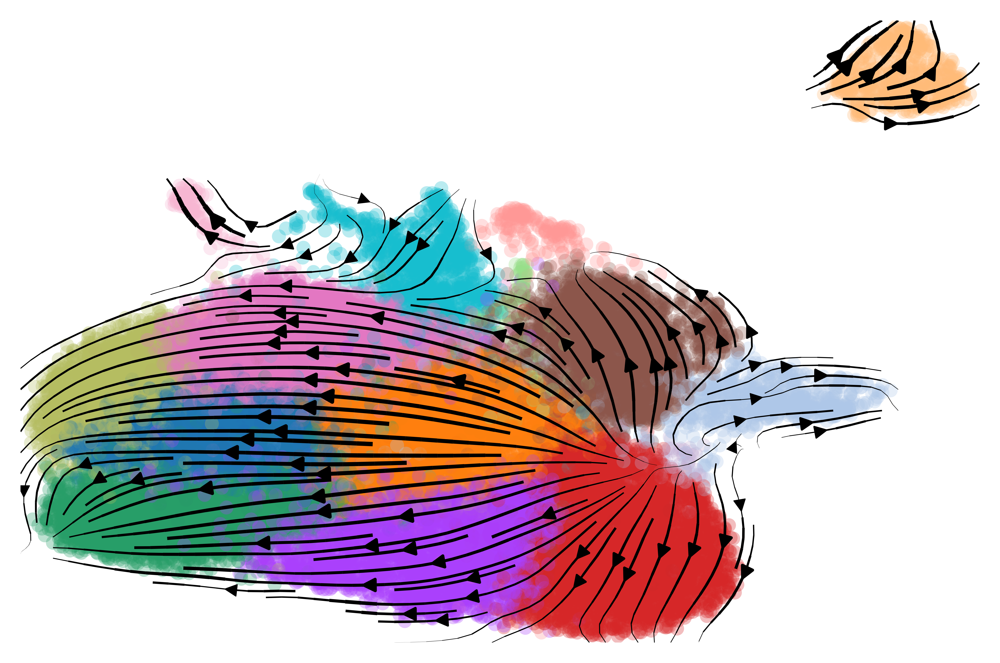

In [10]:
scv.pl.velocity_embedding_stream(   adata,
                                    basis='umap',
                                    color=['leiden_r1'],
                                    title='',
                                    dpi=600,
                                    legend_loc='none',
                                    save='velocity_stream' + suffix + '.svg')

In [11]:
scv.tl.velocity_confidence(adata)

In [12]:
# this is needed due to a current bug - bugfix is coming soon.
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']

In [13]:
scv.tl.paga(adata, groups='leiden_r1')
df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

computing terminal states
    identified 9 regions of root cells and 2 regions of end points .
    finished (0:15:42)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:05)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0.34,0,0,0.53,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0.11,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0.23,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0.28,0.82,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0.13,0,0,0,0,0,0,0,0,0


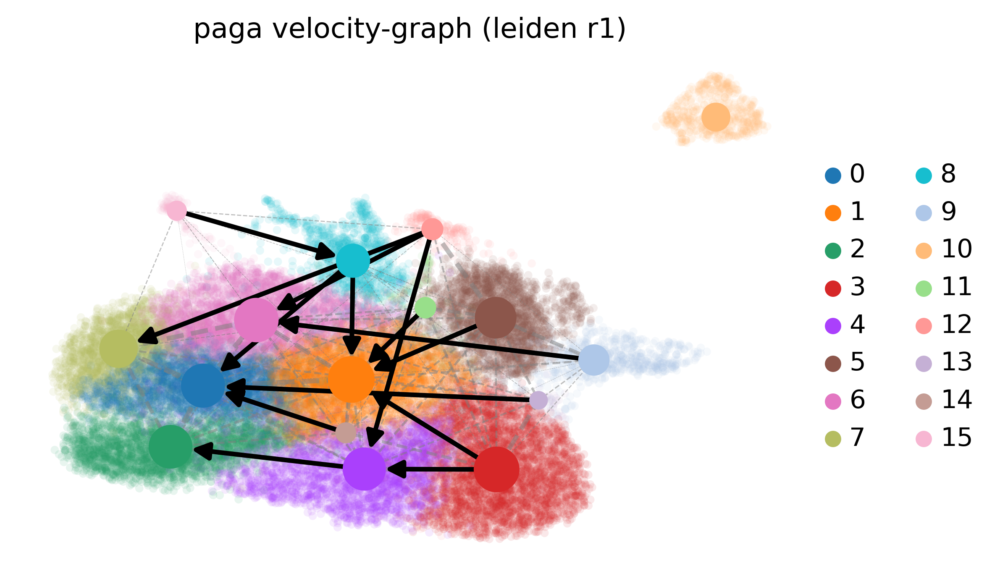

In [14]:
scv.pl.paga(adata, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

## Save Data

In [15]:
# Reminder for the saved data
if savedata:
    print("The filename for the AnnData output of this notebook will be: ")
    print(fn + suffix + ".h5ad")
    print("which will be saved in the h5ad/ folder.")
    
    # Save data to an AnnData file
    adata.write_h5ad(filename = "../../h5ad/" + fn  + suffix + ".h5ad", compression = "gzip", compression_opts = 9)
    print(adata)
    
else:

    print("Not saving the AnnData file!")
    
# End of Notebook
print("\nNotebook Ends")

The filename for the AnnData output of this notebook will be: 
07_25-12-09-10-50_velocity_MRE.h5ad
which will be saved in the h5ad/ folder.
AnnData object with n_obs × n_vars = 28407 × 18505
    obs: 'experiment', 'group', 'timepoint', 'infection', 'cell_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_score', 'predicted_doublet', 'scDblFinder_score', 'scDblFinder_class', 'gem', 'QC', 'n_genes', 'S_score', 'G2M_score', 'phase', 'leiden_r1.5', 'leiden_r1', 'leiden_r0.9', 'leiden_r0.8', 'leiden_r0.7', 'leiden_r0.6', 'leiden_r0.5', 'leiden_r0.4', 'leiden_r0.3', 'leiden_r0.2', 'leiden_r0.1', 'leiden_r1_as_resolved', 'sample_batch', 'batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transit